<a href="https://colab.research.google.com/github/RhondaFischer/CTILGrowth/blob/main/DSbertopic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture
!pip install bertopic

In [ ]:
#from sklearn.datasets import fetch_20newsgroups
#docs = fetch_20newsgroups(subset='all',  remove=('headers', 'footers', 'quotes'))['data']

In [2]:
from bertopic import BERTopic

topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
#topics, probs = topic_model.fit_transform(docs)

In [ ]:
topic_model.get_topic(1)  # Select the most frequent topic

ValueError: ignored

In [ ]:
docs[0]

In [3]:
#from bertopic import BERTopic
import pandas as pd
import numpy as np
import requests
import time
import pytz
import tweepy
from datetime import datetime, timedelta
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
import string

import re

from sklearn.decomposition import NMF, LatentDirichletAllocation

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud, STOPWORDS 
from collections import Counter


import matplotlib.pyplot as plt
%matplotlib inline
string.punctuation

stopWords = set(stopwords.words('english'))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
TWITTER_KEY = 'caEYcNtnPofRcenQSdM1JOA0m'
TWITTER_SECRET = 'XaPN2dNmwx1IrNRy9Llxk35nuzrnG7LP2WmXqdOdLa5gSuKuA8'
TWITTER_BEARER_TOKEN = 'AAAAAAAAAAAAAAAAAAAAANmKVgEAAAAAJdfpUcZi7yJvFogOs921hxiwf20%3DhEzpHFtEBzwTj1rOJXbr2H8R2VAUJlr5HEhdcDkVvS95JXiiIO'
ACCESS_TOKEN = "173821067-MNagHLwNa20HBNSJuTDAYQQrvKlaARk51UWGjDps"
ACCESS_TOKEN_SECRET = "HhR6Lprg5ocs8cDqIZAmbAbef5VXK1z7SBeFLMR0ivyDe"

In [ ]:
def get_tweepy_api():
    auth = tweepy.OAuthHandler(TWITTER_KEY, TWITTER_SECRET)
    auth.set_access_token(ACCESS_TOKEN, ACCESS_TOKEN_SECRET)
    return tweepy.API(auth, wait_on_rate_limit=True, retry_count=10, retry_delay=3)

def get_tweepy_client():
    return tweepy.Client(bearer_token=TWITTER_BEARER_TOKEN, consumer_key=TWITTER_KEY, consumer_secret=TWITTER_SECRET, access_token=ACCESS_TOKEN, access_token_secret=ACCESS_TOKEN_SECRET, wait_on_rate_limit=True)

api = get_tweepy_api()

In [4]:
month_dict = {'Jan':'1', 'Feb':'2', 'Mar':'3', 'Apr':'4', 'May':'5', 'Jun': '6', 
              'Jul': '7', 'Aug': '8', 'Sep': '9', 'Oct':'10', 'Nov':'11', 'Dec':'12' }
day_of_week = {'Sun':'1', 'Mon':'2', 'Tue':'3', 'Wed': '4', 'Thu': '5', 'Fri':'6', 'Sat':'7'}
def process_lumin_tweet(status,is_retweeted, counter = 0):
    counter +=1
    
    
    try:
        status = status._json
    except AttributeError as error:
        pass
    #tweet_data = {}
    tweet_data = pd.DataFrame(columns = [col_names])
    try:
        tweet_text = (status["extended_tweet"]["full_text"]).strip().replace('\n', ' ').replace('\r', '').replace(',', '').replace(u'’', u"'")
        is_extended=True
    except KeyError:
        tweet_text = (status["full_text"]).strip().replace('\n', ' ').replace('\r', '').replace(',', '').replace(u'’', u"'")
        is_extended=False
        
    tweet_id = str(status["id"])
    created_at = status["created_at"]
    tweet_yr = created_at[-4:-1]+created_at[-1]
    tweet_mo = created_at[4:7]
    tweet_mo_nbr = month_dict[tweet_mo]
    tweet_day = created_at[8:10]
    tweet_day_of_week = created_at[0:3]
    tweet_dow_nbr = day_of_week[tweet_day_of_week]
    tweet_hr = created_at[11:13]
    s = "-"
    seq = (tweet_yr, tweet_mo_nbr, tweet_day)
    tweet_date = s.join(seq)
    is_extended_tweet = is_extended
    is_retweet = is_retweeted
    is_quote_tweet = hasattr(status, "quoted_status")
    lang = status["lang"]
    
    if is_extended:
        url_count = len(status["extended_tweet"]["entities"]["urls"])
        hashtag_count = len(status["extended_tweet"]["entities"]["hashtags"])
    else:
        url_count = len(status["entities"]["urls"])
        hashtag_count = len(status["entities"]["hashtags"])
    
    user_json = status["user"]
    
    user_id = str(user_json["id"])
    screen_name = user_json["screen_name"]
    link_to_tweet = "https://twitter.com/{}/status/{}".format(tweet_data["screen_name"], status["id"])
    followers_count = user_json["followers_count"]
    friends_count = user_json["friends_count"]
    user_created_at = user_json["created_at"]
    user_statuses_count = user_json["statuses_count"]
    user_age_days = ((datetime.utcnow().replace(tzinfo=pytz.utc) - datetime.strptime(user_json['created_at'], "%a %b %d %H:%M:%S %z %Y")).days)
    try:
        tweets_per_day = user_json['statuses_count'] / user_age_days
    except ZeroDivisionError:
        tweets_per_day = 0
    user_tweets_per_day = tweets_per_day
    user_age_days = user_age_days
    
    retweet_count = status["retweet_count"]
    favorite_count = status["favorite_count"]
    rechecked_time = ((datetime.utcnow().replace(tzinfo=pytz.utc)))
    
    tweet_list = [tweet_text,
                  tweet_id,
                  created_at,
                  tweet_yr,
                  tweet_mo,
                  tweet_mo_nbr,
                  tweet_day,
                  tweet_hr,
                  tweet_day_of_week,
                  tweet_dow_nbr,
                  tweet_date,
                 is_extended_tweet,
                 is_retweet,
                 is_quote_tweet,
                 url_count,
                 hashtag_count,
                 lang,
                 user_id,
                 screen_name,
                 link_to_tweet,
                 followers_count,
                 friends_count,
                 user_created_at,
                 user_statuses_count,
                 user_tweets_per_day,
                 user_age_days,
                 retweet_count,
                 favorite_count,
                 rechecked_time]
    #print("tweet_list", tweet_list)

    return tweet_list


In [5]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [6]:
%cd /content/drive/MyDrive/TwitterLuminaries/

/content/drive/MyDrive/TwitterLuminaries


In [7]:
lumin=pd.read_csv("dsLuminaries.csv")
lumin.columns=['handle']

In [ ]:
lumin_list=list(lumin['handle'])
tweet_results_df = {
    'tweet_text': [], 'tweet_id': [], 'created_at': [], 'tweet_yr': [], 'tweet_mo':[], 'tweet_mo_nbr':[],
    'tweet_day': [], 'tweet_hr': [],'tweet_day_of_week':[] ,'tweet_dow_nbr':[], 'tweet_date': [], 'is_extended_tweet': [],
    'is_retweet': [], 'is_quote_tweet': [], 'url_count': [], 'hashtag_count': [], 'lang': [],
    'user_id': [], 'screen_name': [], 'link_to_tweet': [], 'followers_count': [],
    'friends_count': [], 'user_created_at': [], 'user_statuses_count': [], 'user_tweets_per_day': [],
    'user_age_days': [], 'retweet_count': [], 'favorite_count': [], 'rechecked_time': []
}

col_names = list(tweet_results_df.keys())

In [ ]:
# adapting code from https://fairyonice.github.io/extract-someones-tweet-using-tweepy.html
# for each luminari, collect all their tweets and save in a dataframe
# limited to first 5 as a trial run
cnt = 0
tweet_result_df =pd.DataFrame(columns=[col_names])
for lumin in lumin_list:
    temp_list=[]
    print(lumin, cnt)
    cnt+=1
    
    # initial 200 tweets and set oldest_id
    tweets = api.user_timeline(screen_name=lumin, 
                           # 200 is the maximum allowed count
                            # 129 * 2 = 258 Luminati
                           count=129,
                           include_rts = False,
                           # Necessary to keep full_text 
                           # otherwise only the first 140 words are extracted
                           tweet_mode = 'extended'
                           )
    '''
    client = tweepy.Client(bearer_token=TWITTER_BEARER_TOKEN)

    # Replace with your own search query
    query = 'from:suhemparack -is:retweet'
    tweets = client.search_all_tweets(query=query, tweet_fields=['context_annotations', 'created_at'],
                                  start_time=start_time,
                                  end_time=end_time, max_results=200)

    
    tweets = tw.Cursor(api.search,
                       q=new_search,
                       lang="en",
                       since=date_since).items(5)
    
    '''
    all_tweets = []
    all_tweets.extend(tweets)
    oldest_id = tweets[-1].id
    
    # continue for the next 200 as long as new tweets are returned
    while True:
        tweets = api.user_timeline(screen_name=lumin, 
                               # 200 is the maximum allowed count
                                   # 129 * 2 = 258 Luminati
                               count=129,
                               include_rts = False,
                               max_id = oldest_id - 1,
                               # Necessary to keep full_text 
                               # otherwise only the first 140 words are extracted
                               tweet_mode = 'extended'
                               )
        if len(tweets) == 0:
            break
        oldest_id = tweets[-1].id
        all_tweets.extend(tweets)
        #print('N of tweets downloaded till now {}'.format(len(all_tweets)))
        
    for tweet in all_tweets:
        temp_list.append(process_lumin_tweet(tweet,is_retweeted=False))
    df = pd.DataFrame(temp_list, columns=[col_names])
    tweet_result_df = pd.concat([tweet_result_df, df])
    print("N of tweets downloaded", len(all_tweets))
    

fsgoldstein 0
N of tweets downloaded 1813
JacobChristine 1
N of tweets downloaded 1352
Lacktman 2
N of tweets downloaded 1920
healthtechdan 3
N of tweets downloaded 1442
validic 4
N of tweets downloaded 3047
drstclaire 5
N of tweets downloaded 2605
HCNowRadio 6
N of tweets downloaded 3144
DrWeidner 7
N of tweets downloaded 2414
arwmd 8
N of tweets downloaded 2258
RBlount 9
N of tweets downloaded 2855
ReasObBob 10
N of tweets downloaded 1854
carolflagg 11
N of tweets downloaded 2570
HITMarketingPR 12
N of tweets downloaded 1910
akalali 13
N of tweets downloaded 2792
LightbeamHealth 14
N of tweets downloaded 2892
jessdamassa 15
N of tweets downloaded 1073
mssoftware 16
N of tweets downloaded 1188
cflashman 17
N of tweets downloaded 2966
bkalis 18
N of tweets downloaded 2873
Slabodkin 19
N of tweets downloaded 3250
HITLABnyc 20
N of tweets downloaded 2484
HeatherLandi 21
N of tweets downloaded 1164
Julie__PHM 22
N of tweets downloaded 1995
Bossoft 23
N of tweets downloaded 2864
sarahbenni

TweepError: ignored

In [ ]:
len(tweet_result_df)

335538

In [ ]:
#tweet_result_df['tweet_yr'] = pd.to_numeric(tweet_result_df['tweet_yr'])
tweet_result_df['tweet_yr'] = tweet_result_df['tweet_yr'].apply(pd.to_numeric)
tweet_result_df['tweet_yr'].describe()

,tweet_yr
count,335538.000000
mean,2019.482521
std,1.870248
min,2013.000000
25%,2018.000000
50%,2020.000000
75%,2021.000000
max,2022.000000


In [ ]:
# Filter out tweets from older than 2020
tweet_result_df = tweet_result_df.loc[np.array(tweet_result_df['tweet_yr']) > 2021.0]

len(tweet_result_df)

50980

In [ ]:
tweet_result_df.to_csv("tcc_tweets.csv")

In [8]:
tweet_result_df2 = pd.read_csv("full_ds_lumin_tweets_Nov5.csv")

In [9]:
X = tweet_result_df2.copy()

In [10]:
X.columns = X.columns.get_level_values(0)

In [11]:
# creating a function to encapsulate EDA/preprocessing
# Take a dataframe as input and return DF as output
# Add new numerical features to the dataframe (e.g., number of words in the string)
#
def textPreprocessing(df):
    #lowercase the text strings and remove punctuation
    # store in a new column
    df['processed'] = df['tweet_text'].apply(lambda x: re.sub(r'[^\w\s]',' ', x.lower()))  #\w [a-zA-Z0-9_] \s [ \t\n\r\f\v]
    
    # numerical feature engineering
    # total length of sentence
    df['length'] = df['processed'].apply(lambda x: len(x))
    # get number of words
    df['words'] = df['processed'].apply(lambda x: len(x.split(' ')))
    df['words_not_stopword'] = df['processed'].apply(lambda x: len([t for t in x.split(' ') if t not in stopWords]))
    # get the average word length
    df['avg_word_length'] = df['processed'].apply(lambda x: np.mean([len(t) for t in x.split(' ') if t not in stopWords]) if len([len(t) for t in x.split(' ') if t not in stopWords]) > 0 else 0)
    # get the sum(map(text.count, string.punctuation))/len(text)
    df['punctuationRatio'] = df['tweet_text'].apply(lambda x: sum(map(x.count, string.punctuation))/len(x))
    df['commas'] = df['tweet_text'].apply(lambda x: x.count(','))

    return(df)  # return a dataframe for now

#datasets["train"] = textPreprocessing(datasets["train"])
#datasets["train"].head()

In [12]:
tweetset = textPreprocessing(X)

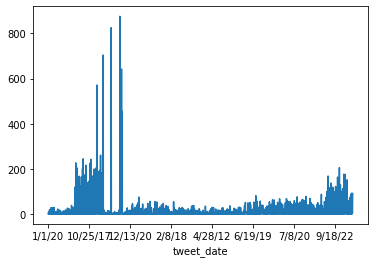

In [13]:
tweetset.groupby(by='tweet_date').size().plot()

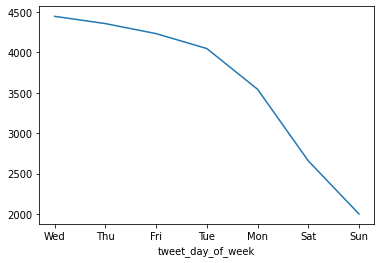

In [14]:
tweetset.groupby(by='tweet_day_of_week').size().sort_values(ascending = False).plot()

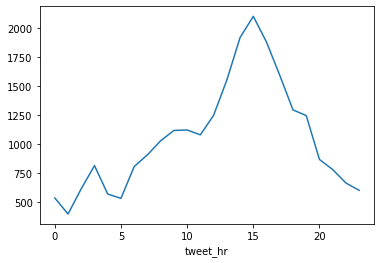

In [15]:
tweetset.groupby(by='tweet_hr').size().plot()

In [16]:
numeric_features = ['url_count', 'hashtag_count','followers_count', 'friends_count',
                    'user_tweets_per_day','user_age_days', 'retweet_count',
                    'favorite_count',
                    'length', 'words', 'words_not_stopword', 'avg_word_length', 
                    'punctuationRatio', 'commas']
text_features = ['processed']
categorical_features = ['is_retweet', 'tweet_day_of_week']

In [17]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.stem.porter import PorterStemmer
import re
from sklearn.compose import ColumnTransformer

In [18]:
from sklearn.base import BaseEstimator, TransformerMixin

class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values  #return a Numpy Array to observe the pipeline protocol

In [19]:
# We create the preprocessing pipelines for both numeric and categorical data.
max_words = 500

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('onehotencoder', OneHotEncoder(handle_unknown='ignore'))])

text_pipeline = Pipeline([
                ('selector', DataFrameSelector('processed')),
                #('tfidf', TfidfVectorizer( stop_words='english')),
                ('tfidf', TfidfVectorizer( norm=None, analyzer='word',
                           max_features=max_words,
                           ngram_range = (1,1),
                            stop_words='english',
                            #stop_words = my_stop_words,
                            #tokenizer=tokenize,
                            use_idf = True,
                           ))
                #('dense', sparse_to_dense())
            ])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),
        ('txt', text_pipeline, text_features)
    ], 
    remainder='drop',
    n_jobs=-1)


In [20]:
X_transformed_sparse = preprocessor.fit_transform(tweetset)
X_transformed_dense = X_transformed_sparse.toarray()

#print(preprocessor.transformers_[1][1])
#print(preprocessor.transformers_[2][1].named_steps["tfidf"].get_feature_names())

column_names1 = numeric_features  + list(preprocessor.transformers_[1][1].named_steps["onehotencoder"].get_feature_names_out(categorical_features))
column_names2 = list(preprocessor.transformers_[2][1].named_steps["tfidf"].get_feature_names_out())
column_names = column_names1+column_names2
print("number of columns:", len(column_names))
display(pd.DataFrame(X_transformed_dense,  columns=column_names).head())
number_of_inputs = X_transformed_dense.shape[1]
dense_df = pd.DataFrame(X_transformed_dense,  columns=column_names)
print("Total Rows:",len(dense_df), "Columns:", len(dense_df.columns))

number of columns: 522


,url_count,hashtag_count,followers_count,friends_count,user_tweets_per_day,user_age_days,retweet_count,favorite_count,length,words,...,womenintech,work,working,world,xbond49,year,years,yes,ym78200,yuhelenyu
0,0.506359,0.057489,1.03077,-0.327681,0.439265,-0.246244,-0.070019,-0.068068,1.221182,1.000222,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.506359,0.684261,1.03077,-0.327681,0.439265,-0.246244,-0.041091,-0.048898,0.082440,0.470565,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-1.288979,1.781111,1.03077,-0.327681,0.439265,-0.246244,-0.074151,-0.069077,1.397276,1.294476,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.506359,-0.569282,1.03077,-0.327681,0.439265,-0.246244,-0.057621,-0.058988,1.139005,1.117924,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-1.288979,-0.882668,1.03077,-0.327681,0.439265,-0.246244,-0.074151,-0.069077,-2.230262,-2.295425,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Total Rows: 25280 Columns: 522


In [21]:
dense_df['screen_name']=tweetset['screen_name'].copy()

In [22]:
dense_df['words_not_stopword'].mean()

-4.4971059225322796e-17

In [23]:
def create_nmf_df(number_of_topics, features_per_topic, fitted_corpus, source, word_list):

    #nmf = NMF(n_components=number_of_topics, solver="mu")
    #nmf = NMF(n_components=number_of_topics, random_state=1, alpha=.1, l1_ratio=.5)
    nmf = NMF(n_components=number_of_topics, random_state=1, beta_loss='kullback-leibler', solver='mu', max_iter=1000, alpha_W=.1,l1_ratio=.5)
    
    
    W = nmf.fit_transform(fitted_corpus)
    H = nmf.components_
    nmf_list = []

    for i, topic in enumerate(H):
        print("Topic {}: {}".format(i + 1, ", ".join([str(x) for x in word_list[topic.argsort()[-features_per_topic:]]])))
        #print(-number_of_topics)
        top_features_ind = topic.argsort()[:-number_of_topics - 1:-1]

In [24]:
def create_tf_df(max_words, tf_corpus, source):
    
    print("**** tf *******")

    tf_vect = CountVectorizer(max_df=0.95, min_df=2,
                                    analyzer='word',
                                    max_features=max_words,
                                    ngram_range = (1,1),
                                    tokenizer=tokenize
                                    )
    tf_fit_vec = tf_vect.fit(tf_corpus)
    tf = tf_fit_vec.transform(tf_corpus)

    # create an array of the names
    tf_words = np.array(tf_vect.get_feature_names_out())
    print("length of tf_words", len(tf_words))

    # sort the words by top frequency
    sum_tf = tf.sum(axis=0)
    words_tf = [(word, sum_tf[0, idx]) for word, idx in tf_fit_vec.vocabulary_.items()]
    words_tf =sorted(words_tf, key = lambda x: x[1], reverse=True)
    
    # create a data frame with graph headings and print the header 
    tf_df = pd.DataFrame(words_tf[0:50], columns = [["Token", "Count"]])
    tf_df = tf_df[['Token','Count']]
    print(tf_df.head(25), "\n")
    
    # create tf word cloud
    words = tf_df['Token'].to_numpy()
    words = list(words.T)
    listToStr = ' '.join([elem for elem in words[0]])
    wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white', 
                stopwords = my_stop_words, 
                min_font_size = 10).generate(listToStr) 
    
    # plot the WordCloud image                        
    plt.figure(figsize = (4, 6), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show()

    
    return tf_df, tf, tf_words

# tf_df, tf = create_tf_df(100000,all_corpus['IsraelNAS'])

In [25]:
# functions for tokenizing the tweets, removing stop words, including key words
# using reg expressions to remove website and hashtag strings (starting with http and #)
# only using text characters and character strings with lengths between 2 and 20 characters

my_stop_words = text.ENGLISH_STOP_WORDS.union(["https", "http", "amp", "like","ll", "ve",
                                              "theyr", "isnt", "dont", "just", "that"])

def wordsToList(strn):
    L = strn.split()
    #pat1 = r'@[A-Za-z0-9_]+'
    pat2 = r'@[\w]+'
    pat3 = r'https?://[^ ]+'
    pat4 = r'#[^ ]+'    
    combined_pat = r'|'.join((pat2,pat3,pat4))
    cleanL = []
    for e in L:
        word = ''
        stripped = re.sub(combined_pat, '', e)
        letters_only = re.sub("[^a-zA-Z]",'', stripped)
        if len(letters_only)>1 and len(letters_only) <20:          
            cleanL.append(letters_only.lower())
    return cleanL

stemmer = PorterStemmer()
def tokenize(text):
        tokens = wordsToList(text)
        words = [x for x in tokens if x not in my_stop_words]
        #stems = [stemmer.stem(item) for item in words]
        return words

#my_stop_words

**** tf *******
length of tf_words 500
              Token Count
0              data  6715
1                ai  6628
2               iot  5663
3           bigdata  4965
4       datascience  4340
5              tech  3483
6            python  3255
7           fintech  3197
8   machinelearning  3165
9              iiot  3097
10        marketing  2730
11          digital  2724
12       daysofcode  2583
13          finserv  2534
14        analytics  2267
15       javascript  2248
16               ml  2031
17        insurtech  2027
18   enricomolinari  2010
19            iotpl  1973
20        metaverse  1910
21          privacy  1909
22           coding  1862
23     iotcommunity  1681
24    cybersecurity  1654 



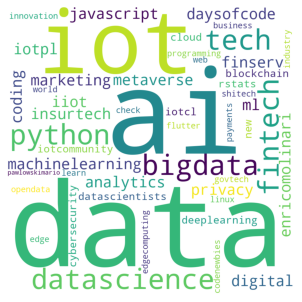

creating tf nmf weights
Topic 1: python, datascience, bigdata, iot, ai
Topic 2: enricomolinari, insurtech, finserv, marketing, fintech
Topic 3: learn, tech, privacy, digital, data
Topic 4: people, energy, technology, new, world
Topic 5: enilev, hanaelsayyed, curieuxexplorer, pawlowskimario, shitech
Topic 6: evankirstel, ev, fisherm, yuhelenyu, sustainability
Topic 7: ev, esg, fintech, space, remotework
Topic 8: ev, finserv, yuhelenyu, cryptocurrency, protocol
Topic 9: datavisualization, cybersecuritytips, pythonlearning, daysofcodechallenge, pythonprogramming
Topic 10: ev, fintech, yuhelenyu, jeromemonange, bitcoin
Topic 11: jblefevre, mashable, la, robot, robotics
Topic 12: fabriziobustama, yuhelenyu, drferdowsi, jeancayeux, thank


In [26]:
# dense_df.sample(frac=0.05)
'''
X_train = sample_df.copy()
y_train = sample_df['y3'].copy()
X_train = X_train.drop(columns=['y3','y10'])
'''

tf_df, tf, tf_words = create_tf_df(500, X['processed'], "twitter")

print("creating tf nmf weights")
nmf_tf_df = create_nmf_df(12, 5, tf, "lumin", tf_words)

In [27]:
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
#JBtopics, JBprobs = topic_model.fit_transform(tf_words)
JBtopics, JBprobs = topic_model.fit_transform(X['processed'])

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Batches:   0%|          | 0/790 [00:00<?, ?it/s]

2022-11-07 16:04:48,076 - BERTopic - Transformed documents to Embeddings
2022-11-07 16:05:56,702 - BERTopic - Reduced dimensionality
2022-11-07 16:10:31,106 - BERTopic - Clustered reduced embeddings


In [28]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name
0,-1,8948,-1_the_of_to_privacy
1,0,886,0_codenewbies_linux_programming_artificialinte...
2,1,417,1_bot_flutter_tensorflow_govtech
3,2,320,2_well_yikes_co_https
4,3,246,3_ukraine_russia_war_russian
5,4,218,4_100daysofcodechallenge_pythonprogramming_pyt...
6,5,208,5_reddit_developer_jobs_datasecurity
7,6,199,6_quotes_quotestoliveby_wednesdaythoughts_wedn...
8,7,198,7_biometricupdate_biometrics_biometric_govtech
9,8,190,8_tmobile_5g_verizon_mobile


-1 refers to all outliers and should typically be ignored. Next, let's take a look at a frequent topic that were generated:

In [29]:
topic_model.get_topic(9)  # Select the most frequent topic

[('democracy', 0.016743158270455527),
 ('states', 0.015476308845496988),
 ('state', 0.013767692508704564),
 ('network', 0.011227431261578902),
 ('exit', 0.008402701124188575),
 ('nation', 0.007719377718464784),
 ('51', 0.0075159827961319),
 ('but', 0.007274742066970236),
 ('sovereign', 0.006826572518494741),
 ('that', 0.006784802347142151)]

In [30]:
topic_model.get_topic(43)  # Select the most frequent topic

[('smartcity', 0.03712455832561032),
 ('smart', 0.033567729241349396),
 ('cities', 0.02967828280925041),
 ('city', 0.029544523404022034),
 ('smarter', 0.022645068645325186),
 ('idc', 0.021763597772086505),
 ('smartcities', 0.020642050007106102),
 ('ruthbea', 0.019592630087516695),
 ('yesner', 0.019592630087516695),
 ('written', 0.01592431109933812)]

In [31]:
topic_model.get_topic(51)  # Select the most frequent topic

[('de', 0.09230215025180828),
 ('la', 0.0672963260731196),
 ('vous', 0.061475441938084796),
 ('et', 0.05454094351503843),
 ('pour', 0.05157403380318352),
 ('des', 0.0478159964753055),
 ('en', 0.044818618500110395),
 ('les', 0.043800653600000315),
 ('donnes', 0.04143235197023434),
 ('au', 0.0378217305107517)]

In [32]:
topic_model.visualize_topics()

In [33]:
topic_model.visualize_distribution(JBprobs[200], min_probability=0.0001)

In [34]:
topic_model.visualize_hierarchy(top_n_topics=30)

In [35]:
topic_model.visualize_barchart(top_n_topics=20)

In [36]:
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

In [37]:
topic_model.visualize_term_rank()

In [38]:
topic_model2 = topic_model.update_topics(X['processed'], JBtopics, n_gram_range=(1, 2))

In [40]:
topic_model.get_topic(20)   # We select topic that we viewed before

[('remotework', 0.06261499090049874),
 ('remotework https', 0.05312580041275648),
 ('from home', 0.030824116785065435),
 ('home', 0.02984949009473544),
 ('remote', 0.0263520525403925),
 ('forbes remotework', 0.0210858835230167),
 ('work from', 0.019873609673338358),
 ('working', 0.01830665793605482),
 ('working from', 0.01680939342748842),
 ('employees', 0.015727898799335206)]

In [44]:
new_topics, new_probs = topic_model.reduce_topics(X['processed'], JBtopics, JBprobs, nr_topics = 10)

TypeError: ignored

In [45]:
similar_topics, similarity = topic_model.find_topics("tech", top_n=5); similar_topics

[154, 224, 237, 53, 40]

In [46]:
# Save model
topic_model.save("ds_model_Nov7")

/usr/local/lib/python3.7/dist-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.



In [48]:
# Load model
my_model = BERTopic.load("ds_model_Nov7")	

In [49]:
topic_model.visualize_barchart(top_n_topics=40)

In [50]:
topic_model.visualize_hierarchy(top_n_topics=40)

In [51]:
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

In [52]:
topic_model.visualize_topics()

In [53]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name
0,-1,8948,-1_the_of_co_https
1,0,886,0_codenewbies tech_tech deeplearning_codenewbi...
2,1,417,1_python flutter_flutter_bot_100daysofcode bot
3,2,320,2_co_https co_https_you https
4,3,246,3_ukraine_russia_war_russian
5,4,218,4_100daysofcodechallenge_pythonprogramming_pyt...
6,5,208,5_ai datasecurity_rstats reactjs_iiot flutter_...
7,6,199,6_quotes_quotestoliveby_wednesdaythoughts_wedn...
8,7,198,7_biometricupdate_biometrics_biometric_fintech...
9,8,190,8_tmobile_5g_mobile_verizon


In [54]:
topic_model.visualize_distribution(JBprobs[200], min_probability=0.00005)

In [55]:
topic_model.get_topic(232)   # We select topic that we viewed before

[('recent data', 0.057594562899116845),
 ('datasciencectrl https', 0.055711652904630884),
 ('at datasciencectrl', 0.0551500327620734),
 ('feh7yqbcip abdsc', 0.0551215879233415),
 ('co feh7yqbcip', 0.0551215879233415),
 ('automation datastrategy', 0.0551215879233415),
 ('feh7yqbcip', 0.0551215879233415),
 ('industry40 automation', 0.05375492537250906),
 ('datascientists at', 0.05362076306303012),
 ('most recent', 0.05362076306303012)]

In [56]:
topic_model.get_topic(208)   # We select topic that we viewed before

[('mlops', 0.0954662855475928),
 ('mlops modelops', 0.03609191685843182),
 ('enterpriseai', 0.03454379240873387),
 ('ifk1h8si26', 0.03412230080471278),
 ('modelops enterpriseai', 0.03412230080471278),
 ('co ifk1h8si26', 0.03412230080471278),
 ('co fo4u9ueib6', 0.03412230080471278),
 ('improve ai', 0.03412230080471278),
 ('ifk1h8si26 abdsc', 0.03412230080471278),
 ('performance accuracy', 0.03412230080471278)]